<a href="https://colab.research.google.com/github/jacobjk03/Projects/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class dog breed classification

This notebook build an end to end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data we are using is from kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The Evaluation is prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning
* There are 120 breeds of dogs  (This means there are 120 different classes).
* There are around 10,000+ images in the training set.(These images have labels)
* There are around 10,000+ images in the test set. (These images have no labels as we have to predict them)




In [ ]:
# Unziped the uploaded data in Google drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get our workspace ready
* Import tensorflow 2.x
* Import tensorflow hub
* Make sure we are using a GPU



In [ ]:
# Import necessory tools:
import tensorflow as tf
import tensorflow_hub as hub
print("Tensorflow version: ", tf.__version__)
print("Tensorflow_hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "Available (YESSS!!)" if tf.config.list_physical_devices("GPU") else "Not Available :(")

Tensorflow version:  2.5.0
Tensorflow_hub version:  0.12.0
GPU Available (YESSS!!)


## Getting our data ready (Turning into tensors)

With all machine learning models our data has to be in numeric format. So thats what we are going to do now turning our images into Tensors (Numerical representations.)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data 
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     2090b25cc76e68a9974e9984d213ec03  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


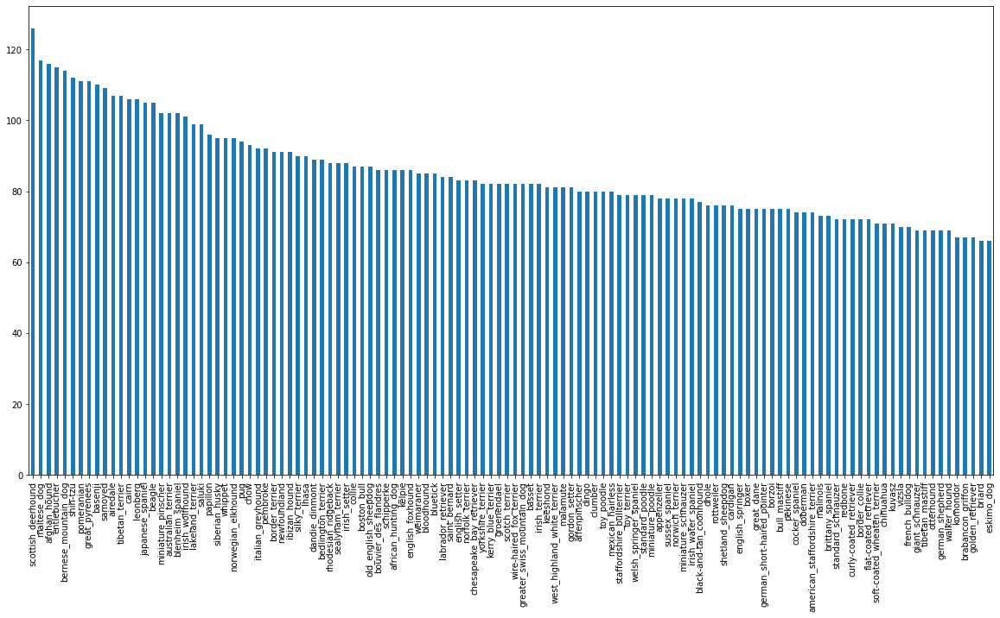

In [ ]:
# How many images are there of each breed (Class)
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
# find mean/median of a column
labels_csv.breed.value_counts().median()

82.0

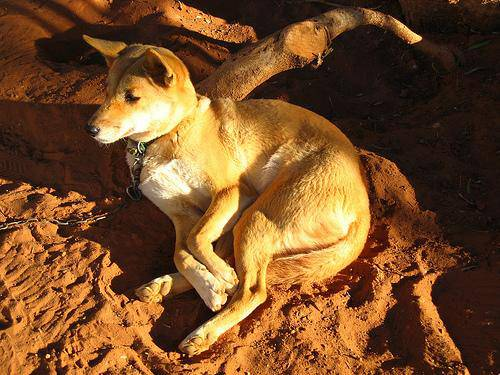

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from Image ID's
filenames = ["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files!!! Proceed.


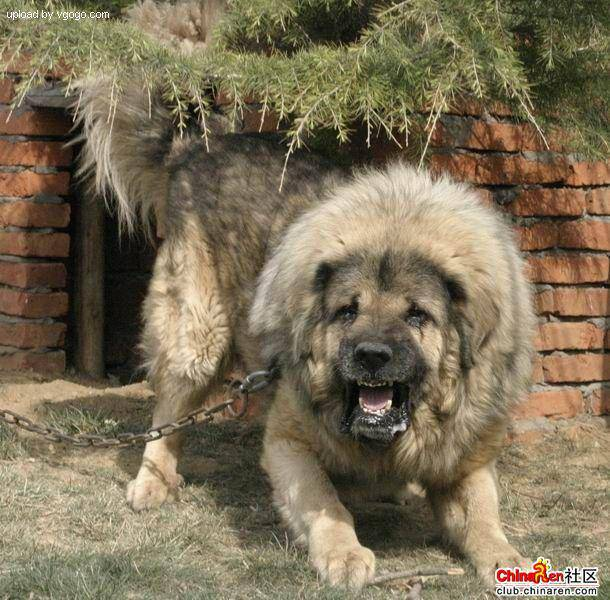

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

'tibetan_mastiff'

Since we have got our trainig imagefilepaths in a list let's prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv.breed.to_numpy()
# labels = np.array(labels) # Does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches with number of filenames
if len(labels) == len(filenames):
  print("number of labels matches with number of filenames")
else:
  print("number of labels does not matches with number of filenames")

number of labels matches with number of filenames


In [ ]:
# Find the unique labels
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labelinto a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array in integers
print(labels[0])                                       # Original label
print(np.where(unique_breeds == labels[0]))            # Index where label occurs
print(boolean_labels[0].argmax())                      # Index where label occurs in boolean array
print(boolean_labels[0].astype(int))                   # There will be 1(True) where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle doen't come with a validation set. We are going to create our own

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images fo experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step: 1000}

In [ ]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split

# Split them into trainning and validation set of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a check
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning images into tensors)
To preprocess our images into Tensores we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use tensorflow to read the file and save it to variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Normalize our image (convert colour channels values from 0-225 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`


Before we do, lets see what importing an image looks like

In [ ]:
# convert an imnage into a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen how an image looks like in Tensors, lets make a function and preprocess them.

In [ ]:
# Define mage size
IMG_SIZE = 224        # image to be a shape of (224, 224)

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into Tensor
  """
  # Step 1,2 Read in an image file
  image = tf.io.read_file(image_path)      # (Read the image and save them in string of tensors)
  # Step 3 Turn the jpeg image into numerical Tensor with 3 colour channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Step 4 NORMALIZATION: Convert the colour channel values from 0-225 to 0-1 values (as from the above code the values of RGB are b/w 0-225 but converting that to 0-1)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Step 5 Resize the image to our desired values (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  # Step 6 Return the modified image
  return image

## Turning our data into batches

Why turn our data into Batches?

Lets say you are trying to process 10,000+ images in one go.... they might not fit in the memory (As we need higher RAM even if we have GPU)

So thats why we do about 32 (This is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)` # We need 32 of these

In [ ]:
# Create a simple function to return a tuple of tensors (image, label)
def get_image_label(image_path, label):
  """
  Takes the image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """

  image = process_image(image_path)   # Above function taking path and converting to tensors
  return image, label 

In [ ]:
# Demo of the above
(get_image_label(X[42], tf.constant(y[42])))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form of `(image, label)` lets make a function to turn all of our data X and y into batches  

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.  
  Shuffle the data if it's training data but doesnt shuffle if its validation data.
  Also accepts test data as inputs (No labels that is why y=None)
  """
  # if the data is a test dataset, the definetly we dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is the valid dataset we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y))) # labels
    # Create image label tuple (This also turns the image path into a preprocessed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                               tf.constant(y))) 
    # Shuffling the pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create image label tuple (This also turns the image path into a preprocessed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
len(train_data), len(val_data), len(X_train), 32*25

(25, 7, 800, 800)

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

our data is now in batches but these can be a little hard to understand/comprehend.. so let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Tuen the grid lines off
    plt.axis("off")
    

In [ ]:
# As our data is in batch we need to unbatch it to visualize
train_images, train_labels = next(train_data.as_numpy_iterator())  # as_numpy_iterator to unbatch the data and save inthose 
len(train_images), len(train_labels)

(32, 32)

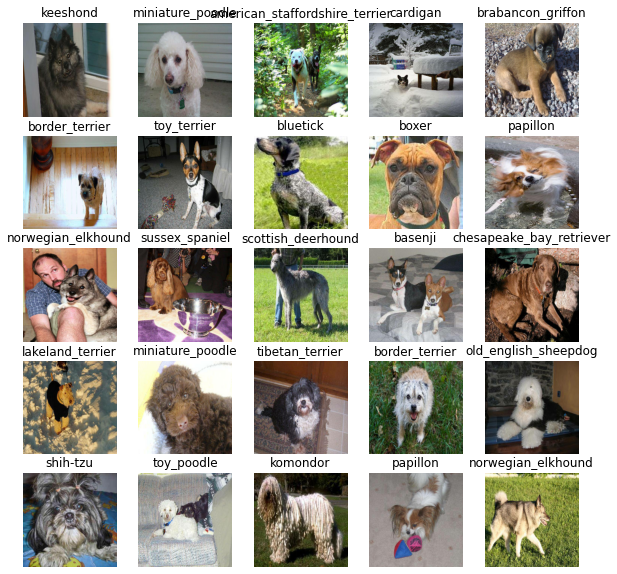

In [ ]:
# Now lets visualize our data in our training batch
show_25_images(train_images, train_labels)

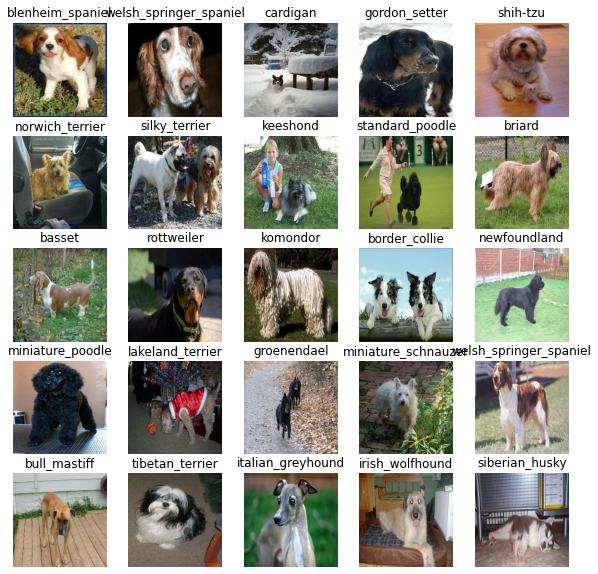

In [ ]:
# Now if we do it again it will take 25 images of next batch having 25 batches total
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
len(train_images)

32

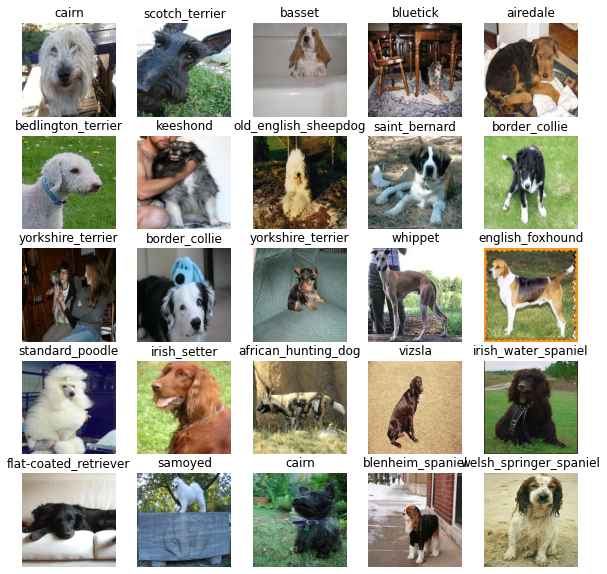

In [ ]:
# Now lets visualize for validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

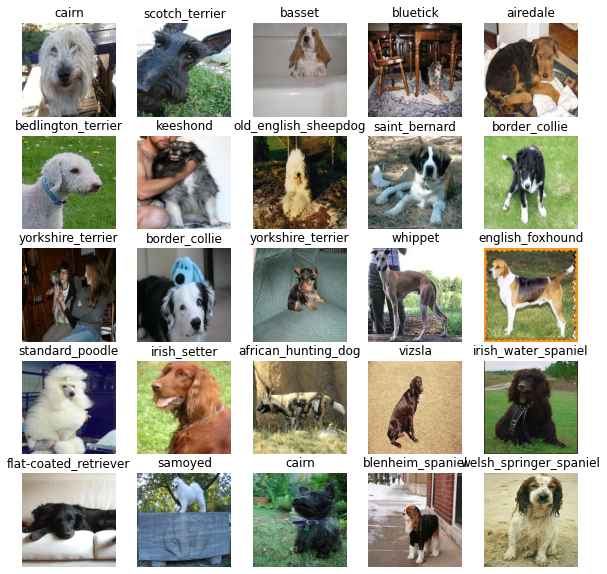

In [ ]:
# Now lets visualize for validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

As we are not shuffling the validation set its not changing showing the first 25 images of 1st batch

## Building a model 
Before we build a model, there are a few things we need to define
* The `Input` shape (our images shape, in the form of Tensors) to our model.
* The `Output` shape (image labels, in the form of Tensors) of our model.
* The URL of the model we have to use (Using transfer learning) from TensoFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batchs, height, width, colour channels

# Setup the output shape of our model.
OUTPUT_SHAPE = len(unique_breeds)

# Setup URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we have got our inputs, outputs and model. lets puts together into a keras deep learning model.

Knowing this, Lets create a function which:
* Takes the Input shape, output shape and the model we have chosen as parameters.
* Defines the layers in a keras model in a sequential fashion (Do this first, then this, then that)
* Compiles the model (Says how it should be ivaluated and improved).
* Builds the model (Tells the model the kind and the input shape it'll be getting).
* Return the model. 

All of these steps can be found here.. https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup model layers
  model = tf.keras.Sequential([                          # Sequential groups a linear stack of layers into a tf.keras.Model.
    hub.KerasLayer(model_url),                           # Layer 1 (Input Layer)- hub telling KerasLayer to create a layer of model_url
    tf.keras.layers.Dense(units=output_shape,            # Layer 2 (Output Layer) Now why using dense- mobilenetv2 make many layers(hidden and gives output in the form of (1,1,1280) but we need in 120 as the are only that many breeds so we give our own output shape by using dense function) see MobileNetV2 architecture for better understanding
                          activation="softmax")          # Activation if using binary classification then "sigmoid" but if multi class classification the "softmax"...what is softmax-  but after applying softmax, each component will be in the interval {\displaystyle [0,1]}[0,1], and the components will add up to 1, so that they can be interpreted as probabilities.
  ])

  # compile the model                                    
  model.compile(                                         # The storry is i am blind folded and have to come down a hill so my friend helping to come down Adam(Optimizer) the far i go from bottom the larger the loss. and i am judged on basis of accuracy
      loss=tf.keras.losses.CategoricalCrossentropy(),    # Our goal is to minimize the loss (getting to the bottom) Loss means how well(Accuracy) the model is guessing while training... the higher the loss the worst the model is learning patterns.... for binary classification loss is "Ninary Crossentropy"for multi class "Categorical crossentropy"
      optimizer=tf.keras.optimizers.Adam(),              # optimizer is helping how to minimize the loss/ lower the loss function telling Instructions the optimizer name is Adam which performs well on most optimizer
      metrics=["accuracy"]                               # this is the Judge on this we judge the performance of the model aka the decide if the loss is higher or lower by calculating the accuracy of the prediction
  )

  # Build the model
  model.build(input_shape)                               # build the model by giving image shape to MobileNetv2 to get trained

  return model

In [ ]:
model = create_model()
model.summary()                       

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper function that a model can use during training to do such things like saving its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model for training too long (As not getting over fitted).

### TensorBoard Callback

To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs into our directory and pass it to our models fit() function
3. Visualize our models training logs with a %tensorboard magic function (we will do this after training our model.)

In [ ]:
# Load tensorboard notebook extension (loaded the tensorboard extension in our notebook)
%load_ext tensorboard

In [ ]:
import datetime          # as we have to track

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs (made a folder)
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",                             # Everytime we run the function it will create a path in the log file with the name appended as date time
                        # make it so the logs get tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)      #This callback logs events for TensorBoard, including: Metrics summary plots, Training graph visualization, Activation histograms, Sampled profiling

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)                 # patience: Number of epochs with no improvement after which training will be stopped.

## Training a model (on a subset)

Our first mdel is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# check to make sure we are still running on a gpu
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU available


Lets create a function which trains a model:

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the call back we would like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returned the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it th callback that we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 108s 4s/step - loss: 4.6408 - accuracy: 0.0887 - val_loss: 3.6450 - val_accuracy: 0.1500
Epoch 2/100
25/25 [==============================] - 3s 121ms/step - loss: 1.6758 - accuracy: 0.6925 - val_loss: 2.2282 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5812 - accuracy: 0.9337 - val_loss: 1.7209 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 3s 113ms/step - loss: 0.2610 - accuracy: 0.9900 - val_loss: 1.5175 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1491 - accuracy: 0.9962 - val_loss: 1.4485 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.4020 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

As our model is overfitting... What are some ways to prevent overfitting in a deep learning neural networks.

NOTE= OVERFITTING TO BEGIN WITH IS A GOOD THING..... IT MEANS OUR MODEL IS LEARNING

### Checking the tensorboard logs

The TensorBoard magic function `%tensorboard` will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 273), started 0:04:36 ago. (Use '!kill 273' to kill it.)

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
val_data


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)     # verbose means show the progress
predictions

7/7 [==============================] - 1s 83ms/step


array([[1.1835480e-03, 4.9868907e-04, 1.7797013e-03, ..., 1.4078571e-03,
        4.3742257e-05, 3.2206739e-03],
       [2.6728150e-03, 4.2068757e-04, 2.7524034e-02, ..., 2.3770830e-04,
        1.6846803e-03, 3.0115674e-05],
       [4.9660462e-06, 3.4434226e-05, 6.1161286e-06, ..., 5.9884014e-06,
        3.2190124e-05, 1.7160397e-04],
       ...,
       [2.5475965e-05, 6.6521970e-05, 9.6807642e-05, ..., 3.0527572e-05,
        3.2799455e-04, 1.9291518e-04],
       [3.1975694e-03, 1.0569588e-04, 3.8703467e-05, ..., 1.8599202e-04,
        3.2056083e-05, 7.5013279e-03],
       [2.1321981e-04, 1.3079427e-04, 8.4497797e-04, ..., 5.7250243e-03,
        5.8771769e-04, 1.6225489e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0], len(predictions[0])

(array([1.18354801e-03, 4.98689071e-04, 1.77970133e-03, 4.54754423e-04,
        3.46677320e-04, 1.63794430e-05, 4.43115551e-03, 2.31683021e-04,
        6.11921205e-05, 1.53305987e-03, 6.94387534e-04, 1.00351863e-04,
        1.92571504e-04, 5.44520371e-05, 5.99323248e-04, 1.15224451e-03,
        9.76378724e-05, 1.79837972e-01, 4.76608802e-05, 1.88384001e-04,
        4.54436895e-03, 5.23857343e-05, 4.60045412e-05, 1.20589277e-03,
        1.84769833e-05, 2.53909937e-04, 9.29168686e-02, 3.82033941e-05,
        1.09528273e-03, 8.64067188e-05, 1.37198484e-04, 1.07636175e-03,
        6.52148505e-04, 4.62481548e-05, 9.69851899e-05, 2.59766839e-02,
        3.03291217e-05, 2.29536905e-03, 8.01149072e-05, 1.77014605e-04,
        3.15398281e-03, 2.94255278e-05, 3.63274703e-05, 8.88963914e-05,
        3.89035704e-05, 2.22728795e-05, 8.74727448e-06, 1.06961781e-03,
        1.16613763e-03, 2.22276503e-04, 8.43784219e-05, 2.23584739e-05,
        2.49084755e-04, 2.66212970e-04, 8.12776445e-04, 1.100683

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# first prediction 
index = 40
print(predictions[index])
print(f"Max value (Probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[4.37322342e-05 3.99832315e-05 8.54379505e-06 2.60084562e-05
 1.18113663e-02 6.36465731e-04 7.36229731e-06 1.19344215e-04
 2.60659523e-04 9.48534216e-05 1.64727899e-05 2.27862023e-04
 5.74142719e-03 5.64508264e-05 1.22842903e-03 6.14933553e-04
 1.41029988e-04 1.22476229e-03 8.93496053e-06 7.73430802e-05
 1.77463371e-04 1.23846170e-04 6.68504654e-05 1.10704685e-04
 1.33558249e-04 3.07994802e-03 5.61695379e-05 2.48776894e-04
 3.14148539e-03 5.14866297e-05 2.65389117e-05 6.11261697e-04
 1.06903164e-04 2.18584057e-04 1.48016098e-03 2.61599507e-05
 8.08522818e-05 5.85680827e-04 7.32349581e-04 8.37826010e-05
 4.35571535e-04 3.00111278e-05 3.27631179e-03 9.47461056e-04
 2.41377461e-03 4.53285465e-05 7.14450027e-04 8.14295083e-04
 4.00316156e-03 8.34219041e-04 3.31391093e-05 6.44563872e-04
 2.17534089e-03 1.26997766e-04 1.30392233e-04 8.62478919e-05
 1.04679975e-05 4.91704159e-05 6.28773589e-04 1.52863402e-04
 1.12347743e-05 4.07032239e-05 7.95620435e-05 2.00211347e-04
 4.44918514e-05 7.028470

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note** Prediction probability are also known as confidence levels.


In [ ]:
# Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into numbers
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predicted probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our val_data is still in a batch dataset, we will have to unbatchify it to make predictions on the validation images and compare those predictions to the validation labels.

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a funtion to unbatch a batched dataset
def unbatchify(dataset):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation dataset
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'silky_terrier'

Now we have got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validatoin images

Lets make some function to make these all a bit more visualize.

we will create a function which
* Takes an array of prediction probabilities, an of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label
* Plot the predict label, its predicted probability, the truth label and the target image in a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n 
  """
  pred_prob, true_labels, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_labels:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth labels
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_labels),
            color=color)


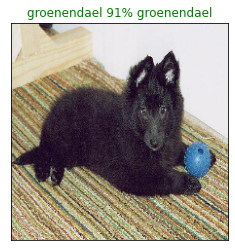

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top prediction, lets make another to view our models top 10 predictions 

The function will:
* Take an input of prediction probability array and a ground truth array and an integer
* Find the prediction using `get_pred_label()` 
* Find the top 10:
  * Prediction probabilities index
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction values and labels, colouring the true labels green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot 
  top_plot = plt.bar(top_10_pred_labels,
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
                       labels=top_10_pred_labels,
                       rotation="vertical")
  
  # Change color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

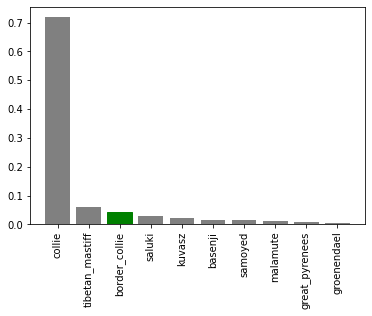

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, 
               labels=val_labels, 
               n=9)

Now we have got some fucntions to help us visualize our predictions and evaluate our model, lets check out a few

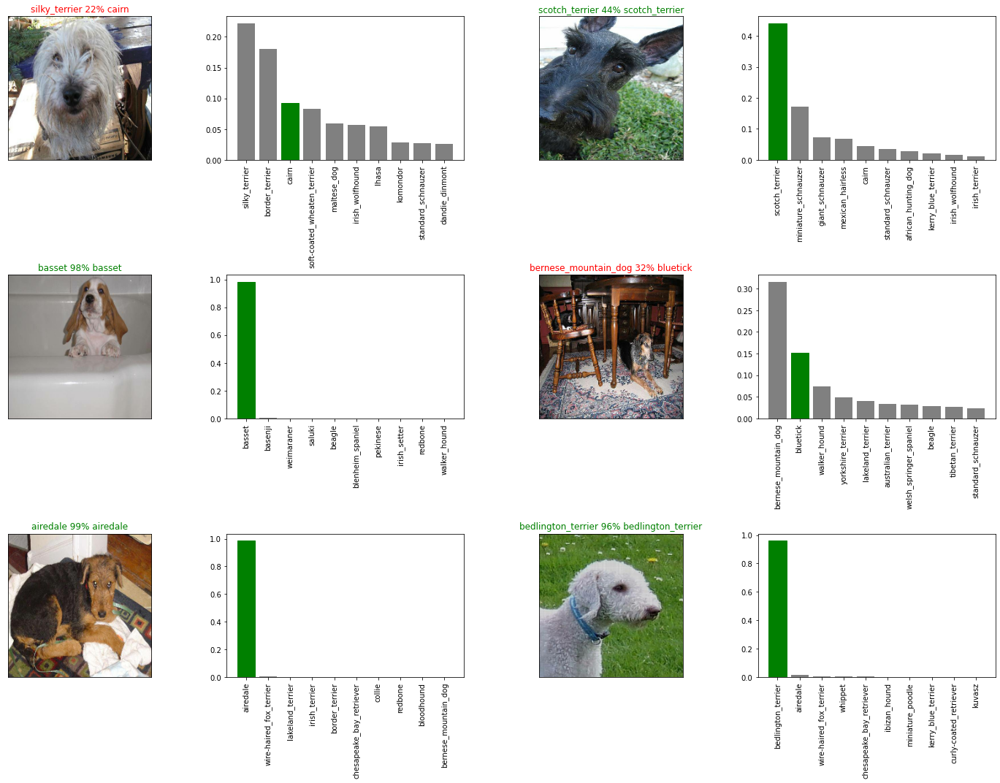

In [ ]:
# Lets check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, 
                labels=val_labels, 
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Lets make a confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix
predicted_labels_ = []
for i in range(0,200):
  predicted_labels_.append(get_pred_label(predictions[i]))
len(confusion_matrix(val_labels, predicted_labels_))

110

## Saving and reloading our trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string).
  """
  # Create a model directory pathname and current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of a model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path 

In [ ]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from a specific path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we have got functions to save and load a trained model, lets make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210715-18241626373442-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210715-18241626373442-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20210715-18241626373442-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210715-18241626373442-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 74ms/step - loss: 1.2794 - accuracy: 0.6450


[1.2794311046600342, 0.6449999809265137]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 76ms/step - loss: 1.2794 - accuracy: 0.6450


[1.2794311046600342, 0.6449999809265137]

## Training the model on the full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**NOTE: ** Running the cell below will take time may be upto 30 mins for the first epochs becoz the GPU we are using in the runtime has to load all of the images into the memory

In [ ]:
# Fit the model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1533s 5s/step - loss: 1.3600 - accuracy: 0.6653
Epoch 2/100
320/320 [==============================] - 31s 97ms/step - loss: 0.4071 - accuracy: 0.8800
Epoch 3/100
320/320 [==============================] - 30s 94ms/step - loss: 0.2402 - accuracy: 0.9363
Epoch 4/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1541 - accuracy: 0.9651
Epoch 5/100
320/320 [==============================] - 31s 97ms/step - loss: 0.1048 - accuracy: 0.9813
Epoch 6/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0776 - accuracy: 0.9851
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0585 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0462 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0372 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 30s 94ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210715-19371626377865-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210715-19371626377865-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the saved model to make predictions on the test data
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210715-19371626377865-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210715-19371626377865-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test data

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get it into the same format.

Luckily we created `create_data_batches()` earlier whcih can take a list of filenames as input and convert them into Tensor batches.

To make predictions in the test data we will:
* Get the test image filenames
* Convert the filenmaes into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test data does'nt have labels)
* Make a prediction array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/MyDrive/Dog Vision/test/e3842312a30d2c53aaf4fc1d5990d330.jpg',
 'drive/MyDrive/Dog Vision/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 'drive/MyDrive/Dog Vision/test/e57a2bee790b512b2ba824b26f3f93fd.jpg',
 'drive/MyDrive/Dog Vision/test/df624595296500c98e3a1bf4d9ea917b.jpg',
 'drive/MyDrive/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/Dog Vision/test/e443bb594a89ab5fa1266748d6b41648.jpg',
 'drive/MyDrive/Dog Vision/test/dd1c29ac3307205b4088ca255ea53919.jpg',
 'drive/MyDrive/Dog Vision/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 'drive/MyDrive/Dog Vision/test/e1b9b0a95a4c7a3c4f3a3a8622314d37.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**NOTE :** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1 hr)

In [ ]:
# Make prediction on the test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1640s 5s/step


In [ ]:
# Save prediction (Numpy array) to csv file to access later
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions from Numpy Array from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.37930345e-13, 1.40363838e-07, 1.92881128e-12, ...,
        3.80198845e-10, 6.20275969e-05, 1.09516861e-07],
       [3.00528560e-11, 2.21050396e-08, 1.27668143e-09, ...,
        2.07270134e-09, 2.70245164e-05, 1.56029772e-10],
       [3.80726578e-06, 7.38347294e-09, 1.19122809e-10, ...,
        1.56758948e-12, 2.68166872e-07, 2.23737473e-07],
       ...,
       [2.06761852e-09, 6.79200351e-01, 8.87192930e-10, ...,
        2.46067433e-09, 4.76508718e-14, 3.79479156e-11],
       [2.40826692e-10, 1.60735120e-10, 3.34361938e-09, ...,
        7.87506578e-05, 9.81448175e-05, 3.37643202e-09],
       [9.36151512e-09, 1.69957382e-08, 3.09334808e-07, ...,
        8.52022936e-07, 2.97682434e-09, 1.08107145e-06]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for kaggle

Looking at kaggle sample submission, we find that it finds our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. 
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe with empty columns
preds_df  = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dcb9aeaf9f1a5c11e95509376d8788ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3842312a30d2c53aaf4fc1d5990d330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2f94ad185a2cfa2311c66c3e8bdba17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e57a2bee790b512b2ba824b26f3f93fd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df624595296500c98e3a1bf4d9ea917b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dcb9aeaf9f1a5c11e95509376d8788ca,4.3793e-13,1.40364e-07,1.92881e-12,0.999912,3.36419e-12,1.41811e-12,6.75933e-11,2.39096e-13,1.37629e-14,3.17864e-12,2.30546e-10,1.1031e-08,1.28128e-11,2.1412e-13,4.77307e-13,6.15725e-11,6.43355e-14,1.18191e-09,8.29005e-13,3.81731e-13,1.45756e-11,3.25803e-12,1.53729e-08,2.84013e-09,6.35695e-11,2.52096e-13,2.86261e-12,1.67863e-13,1.67741e-11,2.88609e-13,2.99105e-12,1.34874e-12,2.4284e-09,4.23288e-09,5.81673e-13,8.67147e-11,1.61316e-12,2.44458e-13,4.58093e-09,...,4.61975e-12,7.33551e-12,8.66657e-07,1.82716e-05,1.1373e-11,1.37415e-12,7.96779e-12,1.6462e-10,7.20488e-14,3.62918e-11,1.30688e-10,1.19441e-08,1.77808e-13,1.20898e-11,1.94504e-15,7.67486e-13,6.90856e-16,6.86229e-09,3.55814e-13,6.23384e-11,2.34095e-15,4.32383e-16,3.66517e-11,7.05086e-08,1.21372e-12,8.72366e-10,4.10926e-06,4.31336e-13,6.68811e-12,1.63713e-10,9.08647e-08,7.79289e-14,1.85215e-09,9.6968e-10,2.45534e-12,3.09447e-10,1.12124e-12,3.80199e-10,6.20276e-05,1.09517e-07
1,e3842312a30d2c53aaf4fc1d5990d330,3.00529e-11,2.2105e-08,1.27668e-09,1.6199e-05,1.57685e-12,1.73178e-06,3.04612e-10,2.17785e-14,1.76713e-09,7.58976e-08,1.33887e-07,1.72096e-10,1.1842e-07,3.67339e-10,3.61174e-11,0.00509495,1.39039e-09,3.13928e-10,3.4354e-06,1.10332e-12,8.44924e-12,4.44901e-13,1.49503e-12,2.80366e-08,2.84523e-07,3.15769e-12,5.56643e-12,1.36432e-12,2.441e-09,1.08596e-11,9.62469e-15,3.21446e-10,2.48962e-09,1.89707e-09,1.54903e-08,1.71244e-08,6.92795e-12,2.07008e-13,6.28666e-08,...,1.65087e-13,7.51358e-16,2.64122e-07,5.25988e-06,1.94851e-12,1.58265e-10,1.75492e-10,9.2977e-14,1.79574e-12,1.19834e-08,8.9719e-08,1.46478e-11,2.87459e-11,8.2671e-09,2.28948e-12,2.9601e-12,6.29315e-10,0.000291629,9.43497e-07,7.27298e-13,6.2873e-09,1.10416e-13,2.06829e-06,1.23086e-07,4.96793e-12,8.63964e-11,1.29816e-09,2.52389e-10,5.58104e-11,4.57643e-09,1.02327e-11,1.35287e-10,2.34763e-06,1.92957e-06,9.31126e-08,2.04996e-09,3.51045e-10,2.0727e-09,2.70245e-05,1.5603e-10
2,e2f94ad185a2cfa2311c66c3e8bdba17,3.80727e-06,7.38347e-09,1.19123e-10,5.88882e-12,1.3977e-10,4.19661e-13,1.57087e-11,1.04765e-10,1.9059e-09,7.04646e-10,7.00428e-12,3.90457e-08,8.53433e-11,1.41988e-09,2.48122e-09,1.12811e-09,3.93761e-09,6.18973e-11,1.13524e-06,1.46162e-10,6.79193e-08,2.17876e-11,5.42608e-08,7.47023e-06,1.10488e-09,1.86484e-09,4.50378e-07,3.10598e-11,2.37839e-09,1.77103e-09,7.98149e-09,1.34439e-08,2.75744e-09,2.64666e-08,3.1987e-13,1.62607e-06,6.25922e-13,4.01757e-12,9.27041e-08,...,5.49003e-10,3.25858e-06,8.3263e-05,8.04129e-07,1.17288e-08,0.975046,2.49391e-12,2.37011e-05,4.40804e-08,5.5191e-11,3.87725e-08,7.81331e-11,1.19002e-09,9.32793e-11,3.56108e-09,4.17301e-10,1.41934e-07,4.98504e-10,3.38277e-07,5.12436e-13,0.00424342,2.64186e-07,7.24779e-09,3.68219e-05,3.11908e-08,2.93488e-11,2.61982e-06,2.79659e-10,1.90016e-05,5.3956e-08,2.08237e-10,6.65471e-09,3.24493e-09,1.88144e-08,7.3765e-11,2.82264e-11,2.93576e-09,1

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

##Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog 2.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog 3.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog 1.jpg']

In [ ]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['maltese_dog', 'german_shepherd', 'golden_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

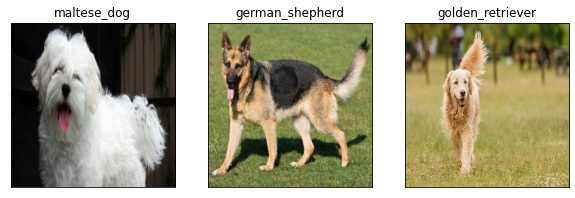

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)